# Credit Card Default Analysis

## Table of contents
0. [Import](#0)
1. [Understanding the problem](#1)
2. [Data splitting](#2)
3. [EDA](#3)
4. [Feature engineering](#4)
5. [Preprocessing and transformations](#5)
6. [Baseline model](#6)
7. [Linear models](#7)
8. [Different classifiers](#8)
9. [Feature selection](#9)
10. [Hyperparameter optimization](#10)
11. [Interpretation and feature importances](#11)
12. [Results on the test set](#12)
13. [Summary of the results](#13)

# Import <a name="0"></a>

In [68]:
import os

%matplotlib inline
import string
import sys
from collections import deque

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb

# data
from sklearn.compose import ColumnTransformer, make_column_transformer

# Classifiers
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

# classifiers / models
from sklearn.linear_model import LogisticRegression

# other
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV,
    cross_val_score,
    cross_validate,
    train_test_split,
    
)

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    make_scorer,
    plot_confusion_matrix,
)

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeRegressor, export_graphviz

## Introduction <a name="in"></a>

In this project, I will be working on an open-ended mini-project, where I will put all the different things I have learned so far in UBC DSCI 571 and 573 together to solve an interesting problem.

## 1. Understanding the problem <a name="1"></a>
<hr>

In this mini project, I will be working on a classification problem of predicting whether a credit card client will default or not. 
For this problem, I will use [Default of Credit Card Clients Dataset](https://www.kaggle.com/uciml/default-of-credit-card-clients-dataset). In this data set, there are 30,000 examples and 24 features, and the goal is to estimate whether a person will default (fail to pay) their credit card bills; this column is labeled "default.payment.next.month" in the data. The rest of the columns can be used as features. I took some ideas and compared my results with [the associated research paper](https://www.sciencedirect.com/science/article/pii/S0957417407006719), which is available through [the UBC library](https://www.library.ubc.ca/). 

**My tasks:**

1. Spend some time understanding the problem and what each feature means. You can find this information in the documentation on [the dataset page on Kaggle](https://www.kaggle.com/uciml/default-of-credit-card-clients-dataset). Write a few sentences on my initial thoughts on the problem and the dataset. 
2. Download the dataset and read it as a pandas dataframe. 

## Observation 1.1  
1. This is a binary classification problem. The task is to predict whether a credit card client will default or not.

2. Target column is default.payment.next.month. "1" stands for yes, which is the class we are more interested in.  There are 24 features. All of them are of numerical data type. Some of the columns are binary such as sex, and some of them are categorical features that are already encoded with orders, such as education, so they should be passed through without any transformation. 

3. The dataset is large enough with 30,000 examples so it does not seem to be a large concern for optimization bias of the validation set.   

4. I would consider this as a small dimensional problem. All features are numerically encoded. That said, some features such as sex and marriage seem more like categorical features.

5. The dataset is from Taiwan so any model developed based on the data may not be appropriate for use in other countries. In addition, the data was collected back in 2005 so it could be outdated. The model should be used with caution. 


In [2]:
credit_df = pd.read_csv("UCI_Credit_Card.csv")
credit_df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


## 2. Data splitting <a name="2"></a>
<hr>

1. Split the data into train and test portions. 

In [3]:
train_df, test_df = train_test_split(credit_df, test_size = 0.30, random_state = 123)
train_df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
16395,16396,320000.0,2,1,2,36,0,0,0,0,...,19370.0,10155.0,3788.0,5000.0,5018.0,1000.0,3000.0,0.0,7013.0,0
21448,21449,440000.0,2,1,2,30,-1,-1,-1,0,...,171244.0,150897.0,117870.0,612.0,87426.0,130007.0,3018.0,15000.0,51663.0,0
20034,20035,160000.0,2,3,1,44,-2,-2,-2,-2,...,-18.0,-18.0,-18.0,0.0,0.0,0.0,0.0,0.0,0.0,0
25755,25756,120000.0,2,2,1,30,0,0,0,0,...,103058.0,71095.0,47379.0,3706.0,5502.0,4204.0,3017.0,2005.0,1702.0,0
1438,1439,50000.0,1,2,2,54,1,2,0,0,...,27585.0,27910.0,27380.0,0.0,1400.0,1200.0,1500.0,1000.0,1500.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28636,28637,380000.0,2,2,1,37,0,0,0,0,...,14291.0,15949.0,15556.0,1204.0,1300.0,1242.0,1900.0,0.0,3000.0,0
17730,17731,360000.0,2,1,1,54,1,-2,-2,-1,...,2580.0,2580.0,6941.0,0.0,0.0,2580.0,0.0,6941.0,0.0,0
28030,28031,50000.0,2,3,1,29,0,0,0,0,...,39420.0,8824.0,9009.0,2002.0,2000.0,1530.0,1000.0,327.0,329.0,1
15725,15726,30000.0,2,2,2,21,0,0,0,0,...,30841.0,29434.0,16565.0,2000.0,2000.0,2000.0,1765.0,331.0,0.0,0


In [4]:
#create X_train, y_train, X_test, y_test

target = "default.payment.next.month"
X_train, y_train = train_df.drop(columns=target), train_df[target]
X_test, y_test = test_df.drop(columns=target), test_df[target]

## 3. EDA <a name="3"></a>
<hr>

**My tasks:**

1. Perform exploratory data analysis on the train set.
2. Explore two summary statistics and two visualizations that might be useful
3. Summarize my initial observations about the data. 
4. Pick appropriate metric/metrics for assessment. 

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21000 entries, 16395 to 19966
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          21000 non-null  int64  
 1   LIMIT_BAL                   21000 non-null  float64
 2   SEX                         21000 non-null  int64  
 3   EDUCATION                   21000 non-null  int64  
 4   MARRIAGE                    21000 non-null  int64  
 5   AGE                         21000 non-null  int64  
 6   PAY_0                       21000 non-null  int64  
 7   PAY_2                       21000 non-null  int64  
 8   PAY_3                       21000 non-null  int64  
 9   PAY_4                       21000 non-null  int64  
 10  PAY_5                       21000 non-null  int64  
 11  PAY_6                       21000 non-null  int64  
 12  BILL_AMT1                   21000 non-null  float64
 13  BILL_AMT2                  

#### Observation 1. 
From the above information, we can see that there are no missing value in the dataset.

In [6]:
train_df['default.payment.next.month'].value_counts(normalize=True)

0    0.776762
1    0.223238
Name: default.payment.next.month, dtype: float64

#### Observation 2.  
We have a class imbalance. Both classes seem importance here and I am going to pick macro-average f1 score as our evaluation metric.

In [7]:
np.max(train_df, axis=0)

ID                              30000.0
LIMIT_BAL                     1000000.0
SEX                                 2.0
EDUCATION                           6.0
MARRIAGE                            3.0
AGE                                79.0
PAY_0                               8.0
PAY_2                               8.0
PAY_3                               8.0
PAY_4                               8.0
PAY_5                               8.0
PAY_6                               8.0
BILL_AMT1                      964511.0
BILL_AMT2                      983931.0
BILL_AMT3                      855086.0
BILL_AMT4                      891586.0
BILL_AMT5                      927171.0
BILL_AMT6                      961664.0
PAY_AMT1                       873552.0
PAY_AMT2                      1227082.0
PAY_AMT3                       896040.0
PAY_AMT4                       621000.0
PAY_AMT5                       426529.0
PAY_AMT6                       528666.0
default.payment.next.month          1.0


In [8]:
np.min(train_df, axis=0)

ID                                 1.0
LIMIT_BAL                      10000.0
SEX                                1.0
EDUCATION                          0.0
MARRIAGE                           0.0
AGE                               21.0
PAY_0                             -2.0
PAY_2                             -2.0
PAY_3                             -2.0
PAY_4                             -2.0
PAY_5                             -2.0
PAY_6                             -2.0
BILL_AMT1                     -15308.0
BILL_AMT2                     -67526.0
BILL_AMT3                    -157264.0
BILL_AMT4                     -50616.0
BILL_AMT5                     -61372.0
BILL_AMT6                    -339603.0
PAY_AMT1                           0.0
PAY_AMT2                           0.0
PAY_AMT3                           0.0
PAY_AMT4                           0.0
PAY_AMT5                           0.0
PAY_AMT6                           0.0
default.payment.next.month         0.0
dtype: float64

In [9]:
import altair as alt
alt.data_transformers.disable_max_rows()
alt.Chart(train_df, title = "Age v. Credit Limit"
         ).mark_point().encode(alt.X("AGE", title="Age"), alt.Y("LIMIT_BAL", title="Credit Limit"))

alt.Chart(...)

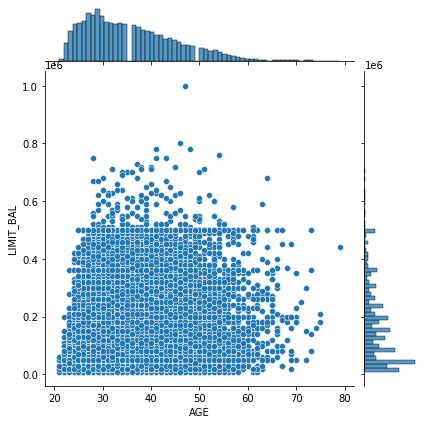

In [10]:
sns.jointplot(x="AGE", y="LIMIT_BAL", data=train_df)

#### Observation 3.  
It does not seem that there is a correlation between age and credit limit. 

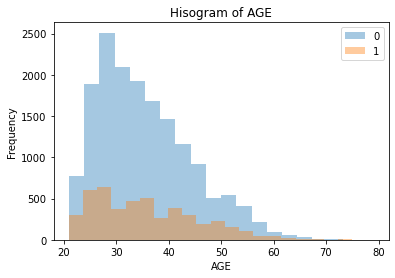

In [11]:
feat = "AGE"
ax = train_df.groupby("default.payment.next.month")[feat].plot.hist(bins=20, alpha=0.4, legend=True)
plt.xlabel(feat)
plt.title("Hisogram of AGE")
plt.show()

#### Observation 4.    
Age does not seem to be a useful predictor in default payments because both classes present similar distribution in all age groups. 

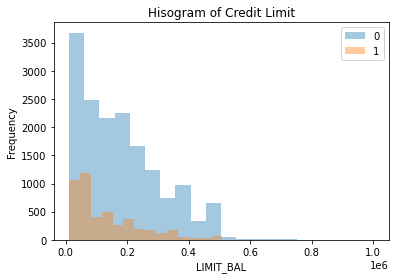

In [12]:
feat = "LIMIT_BAL"
ax = train_df.groupby("default.payment.next.month")[feat].plot.hist(bins=20, alpha=0.4, legend=True)
plt.xlabel(feat)
plt.title("Hisogram of Credit Limit")
plt.show()

#### Observation 5.  
Credit Limit also does not seem to be a particular useful predictor in default payments because both classes present similar distribution in all credit limit group. 

### Heatmap

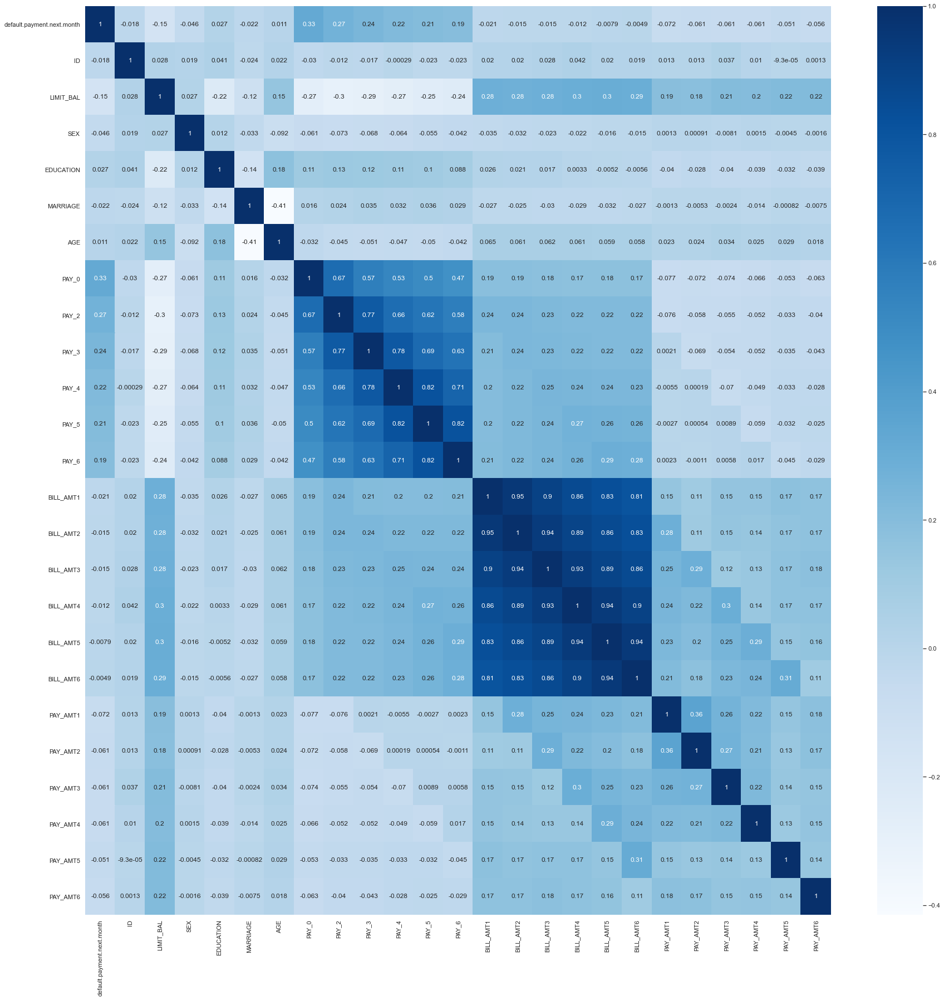

In [13]:
cor = pd.concat((y_train, X_train),axis=1).iloc[:,:30].corr();
plt.figure(figsize=(30,30))
sns.set(font_scale=1)
sns.heatmap(cor, annot=True, cmap=plt.cm.Blues);

#### Observation 6.   
Seems like all PAY_\d* features and BILL_AMT\d* features are highly correlated.

### Jointplot of Pay_/d and Bill amout

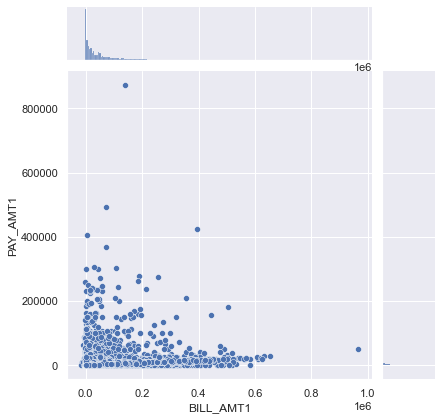

In [14]:
sns.jointplot(x="BILL_AMT1", y="PAY_AMT1", data=train_df)

train_df.hist(figsize=(20,20), bins=20);### Summary of Initial Observation. 
1. There are no missing value, so simple inputer is not needed in data transformation.
2. There is class imbalance, and since we are more interested in one of the classes, I would use f1 score as scoring metric.  

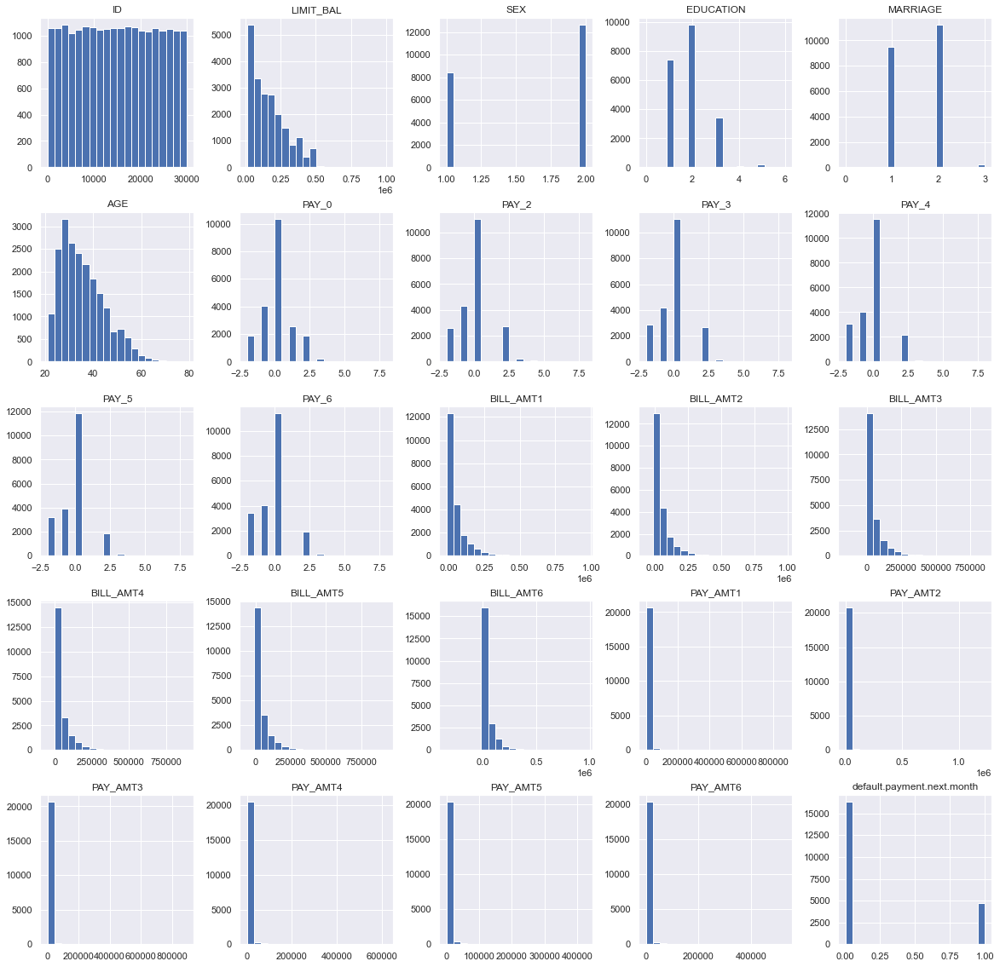

In [15]:
train_df.hist(figsize=(20,20), bins=20);

Some initial observations:

1. We have very few features.
2. We have class imbalance and we need to deal with it. 
3. We have chosen macro average f1 as our metric where both classes get equal weight.
4. The feature ranges are very different, so we'll need to standardize.
5. We have a number of collinear features.
6. We have quite a few outliers.
7. The data is messy / doesn't always correspond to the data description.
8. What are education levels 5 and 6?
9. What does it mean for PAY_* to be -2? Or 0?

## 4. Feature engineering <a name="4"></a>
<hr>


**TO-DO:**

1. Carry out feature engineering. In other words, extract new features relevant for the problem and work with my new feature set in the following exercises.

## 5. Preprocessing and transformations <a name="5"></a>
<hr>


**My tasks:**

1. Identify different feature types and the transformations you would apply on each feature type. 
2. Define a column transformer, if necessary. 

In [16]:
#identify feature types

# drop_features = ["ID"]
# target = "default.payment.next.month"
# binary_features = ["SEX"]
# ordinal_encoded_features = []
# categorical_features = ["MARRIAGE"]
# numeric_features = list(set(train_df.columns)
#                        -set(drop_features)
#                        -set([target])
#                        -set(binary_features)
#                        -set(ordinal_encoded_features)
#                        -set(categorical_features)
#                        )


drop_features = ["ID"]
numeric_features = [
    "LIMIT_BAL",
    "PAY_0",
    "PAY_2",
    "PAY_3",
    "PAY_4",
    "PAY_5",
    "PAY_6",
    "BILL_AMT1",
    "BILL_AMT2",
    "BILL_AMT3",
    "BILL_AMT4",
    "BILL_AMT5",
    "BILL_AMT6",
    "PAY_AMT1",
    "PAY_AMT2",
    "PAY_AMT3",
    "PAY_AMT4",
    "PAY_AMT5",
    "PAY_AMT6",
    "AGE",
]
binary_features = ["SEX"]
categorical_features = ["EDUCATION", "MARRIAGE"]
target = "default.payment.next.month"


In [17]:
#define a column transformer

preprocessor = make_column_transformer(
    ("drop", drop_features),
    #("passthrough", ordinal_encoded_features),
    (StandardScaler(), numeric_features),
    (OneHotEncoder(drop="if_binary"), binary_features),
    (OneHotEncoder(handle_unknown="ignore"), categorical_features),
)

In [18]:
#Defining Helper code adapted from DSCI573 Lab3
def mean_std_cross_val_scores(model, X_train, y_train, **kwargs):
    """
    Returns mean and std of cross validation
    """
    scores = cross_validate(model, X_train, y_train, **kwargs)

    mean_scores = pd.DataFrame(scores).mean()
    std_scores = pd.DataFrame(scores).std()
    out_col = []

    for i in range(len(mean_scores)):
        out_col.append((f"%0.3f (+/- %0.3f)" % (mean_scores[i], std_scores[i])))

    return pd.Series(data=out_col, index=mean_scores.index)

## 6. Baseline model <a name="6"></a>
<hr>


**My tasks:**
1. Try `scikit-learn`'s baseline model and report results.

In [19]:
#make a cusomized f1 scorering method

from sklearn.metrics import f1_score, make_scorer, recall_score

custom_scorer = make_scorer(f1_score, average="macro")
scoring_metric = custom_scorer

In [20]:
#Use DummyClassifier as baseline model 
dummy = DummyClassifier(strategy = "stratified")

results = {}
scoring_metric = scoring_metric
results["Dummy"] = mean_std_cross_val_scores(dummy, X_train, y_train, 
                                             return_train_score=True, scoring=scoring_metric)
pd.DataFrame(results)




,Dummy
fit_time,0.003 (+/- 0.001)
score_time,0.002 (+/- 0.000)
test_score,0.502 (+/- 0.005)
train_score,0.500 (+/- 0.006)


## 7. Linear models <a name="7"></a>
<hr>


**My tasks:**

1. Try logistic regression as a first real attempt. 
2. Carry out hyperparameter tuning to explore different values for the regularization hyperparameter. 
3. Report validation scores along with standard deviation. 
4. Summarize my results.

In [21]:
#Try logistic regression with default C
pipe_lr = make_pipeline(
    preprocessor, LogisticRegression(max_iter=2000, class_weight="balanced")
)
results["logreg"] = mean_std_cross_val_scores(
    pipe_lr, X_train, y_train, return_train_score=True, scoring=scoring_metric
)
pd.DataFrame(results)

,Dummy,logreg
fit_time,0.003 (+/- 0.001),0.389 (+/- 0.083)
score_time,0.002 (+/- 0.000),0.012 (+/- 0.001)
test_score,0.502 (+/- 0.005),0.625 (+/- 0.006)
train_score,0.500 (+/- 0.006),0.628 (+/- 0.003)


In [22]:
#Carry out Hyperparameter Tuning on C 

from scipy.stats import lognorm, loguniform, randint

param_grid = {"logisticregression__C": loguniform(1e-3, 1e3)}

random_search = RandomizedSearchCV(
    pipe_lr,
    param_distributions=param_grid,
    n_iter=50,
    verbose=1,
    n_jobs=1,
    scoring=scoring_metric,
    random_state=123,
    return_train_score=True,
)

random_search.fit(X_train, y_train);

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  1.3min finished


In [23]:
#reporting validation score with LogisticRegression and tuned best C

print("Best hyperparameter values: ", random_search.best_params_)
print("Best score: %0.3f" % (random_search.best_score_))

pd.DataFrame(random_search.cv_results_)[
    [
        "mean_train_score",
        "mean_test_score",
        "param_logisticregression__C",
        "mean_fit_time",
        "rank_test_score",
        "std_test_score",
    ]
].set_index("rank_test_score").sort_index()[:10]

Best hyperparameter values:  {'logisticregression__C': 0.011290431413903904}
Best score: 0.629


,mean_train_score,mean_test_score,param_logisticregression__C,mean_fit_time,std_test_score
rank_test_score,,,,,
1,0.630049,0.629036,0.0112904,0.093812,0.005759
2,0.630119,0.628820,0.0124437,0.102424,0.005739
3,0.629757,0.628285,0.00493981,0.081764,0.006232
4,0.630345,0.628241,0.0229672,0.135575,0.006073
5,0.630344,0.628159,0.0234196,0.119348,0.005999
6,0.629813,0.627771,0.00356968,0.075319,0.005548
7,0.629775,0.627648,0.0318223,0.139570,0.005572
8,0.629114,0.627397,0.0022807,0.068909,0.005280
9,0.629114,0.627311,0.0578475,0.158862,0.005274


In [24]:
best_logreg = random_search.best_estimator_
results["logreg (tuned)"] = mean_std_cross_val_scores(
    best_logreg, X_train, y_train, return_train_score=True, scoring=scoring_metric
)

pd.DataFrame(results).T

,fit_time,score_time,test_score,train_score
Dummy,0.003 (+/- 0.001),0.002 (+/- 0.000),0.502 (+/- 0.005),0.500 (+/- 0.006)
logreg,0.389 (+/- 0.083),0.012 (+/- 0.001),0.625 (+/- 0.006),0.628 (+/- 0.003)
logreg (tuned),0.100 (+/- 0.005),0.011 (+/- 0.000),0.629 (+/- 0.006),0.630 (+/- 0.003)


Summary results:



1. Logistic regression scores are better than the dummy classifier scores.
2. Optimizing the regularization hyperparameter of logistic regression improved the validation scores slightly (from 0.625 to 0.629) but not by much.
3. In both cases it seems like we are underfitting; there is not much gap between train and validation scores. Probably non-linear models might be a better choice here.

## 8. Different classifiers <a name="8"></a>
<hr>


**My tasks:**
1. Try at least 3 other models aside from logistic regression. 
2. Summarize your results. Can you beat logistic regression? 

In [25]:
#Calculate scale positive weight for xgboost and lgbm:

ratio = np.bincount(y_train)[0] / np.bincount(y_train)[1]
ratio

3.4795221843003414

In [26]:
from lightgbm.sklearn import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier


models = {
    "RBF SVM": SVC(),
    "random forest": RandomForestClassifier(class_weight="balanced", random_state=2),
    "xgboost": XGBClassifier(scale_pos_weight=ratio, random_state=2),
    "lgbm": LGBMClassifier(scale_pos_weight=ratio, random_state=2),
}

for name, model in models.items():
    pipe = make_pipeline(preprocessor, model)
    results[name] = mean_std_cross_val_scores(
        pipe, X_train, y_train, return_train_score=True, scoring=scoring_metric
    )

pd.DataFrame(results).T

,fit_time,score_time,test_score,train_score
Dummy,0.003 (+/- 0.001),0.002 (+/- 0.000),0.502 (+/- 0.005),0.500 (+/- 0.006)
logreg,0.389 (+/- 0.083),0.012 (+/- 0.001),0.625 (+/- 0.006),0.628 (+/- 0.003)
logreg (tuned),0.100 (+/- 0.005),0.011 (+/- 0.000),0.629 (+/- 0.006),0.630 (+/- 0.003)
RBF SVM,9.815 (+/- 0.612),0.981 (+/- 0.092),0.675 (+/- 0.008),0.686 (+/- 0.002)
random forest,3.207 (+/- 0.166),0.087 (+/- 0.009),0.668 (+/- 0.003),0.999 (+/- 0.000)
xgboost,1.057 (+/- 0.097),0.017 (+/- 0.002),0.681 (+/- 0.006),0.868 (+/- 0.004)
lgbm,0.320 (+/- 0.140),0.019 (+/- 0.003),0.691 (+/- 0.011),0.772 (+/- 0.004)


### 8.2 Answer  
1. I am using four non-linear models here: RBF SVM and three tree-based models.
2. We are trying all models with default hyperparameters.
3. Similar to logistic regression, SVC del models["RBF SVM"]
also seems to underfit; the gap between train and test scores are not large. 4. Also, as expected, it takes longer to fit compared to other models. Let's abandon it.
5. LGBM seems to be the best performing model among the tree-based models. It also seems to be much faster and overfitting less compared to random forest and xgboost. That said, it's std is higher than the other two models.

In [28]:
# deleting RBF SVM as it is slow

del models["RBF SVM"]

KeyError: 'RBF SVM'

## 9. Feature selection <a name="9"></a>
<hr>


**My tasks:**

Select relevant features. Try `RFECV`, forward selection or L1 regularization for this. Do the results improve with feature selection? Summarize my results. If I see improvements in the results, keep feature selection in my pipeline. If not, I will abandon it in the next exercises. 

In [36]:
#L1 Regularization

from sklearn.feature_selection import RFE, RFECV, SelectFromModel

for name, model in models.items():
    pipe = make_pipeline(
        preprocessor,
        SelectFromModel(
            LogisticRegression(solver="liblinear", penalty="l1", max_iter=1000)
        ),
        #or 
        #SelectFromModel(LassoCV(max_iter=2000)),
        model,
    )
    results[name + "+ feat_sel"] = mean_std_cross_val_scores(
        pipe, X_train, y_train, return_train_score=True, scoring=scoring_metric
    )

In [37]:
pd.DataFrame(results).T

,fit_time,score_time,test_score,train_score
Dummy,0.003 (+/- 0.001),0.002 (+/- 0.000),0.502 (+/- 0.005),0.500 (+/- 0.006)
logreg,0.389 (+/- 0.083),0.012 (+/- 0.001),0.625 (+/- 0.006),0.628 (+/- 0.003)
logreg (tuned),0.100 (+/- 0.005),0.011 (+/- 0.000),0.629 (+/- 0.006),0.630 (+/- 0.003)
RBF SVM,9.815 (+/- 0.612),0.981 (+/- 0.092),0.675 (+/- 0.008),0.686 (+/- 0.002)
random forest,3.207 (+/- 0.166),0.087 (+/- 0.009),0.668 (+/- 0.003),0.999 (+/- 0.000)
xgboost,1.057 (+/- 0.097),0.017 (+/- 0.002),0.681 (+/- 0.006),0.868 (+/- 0.004)
lgbm,0.320 (+/- 0.140),0.019 (+/- 0.003),0.691 (+/- 0.011),0.772 (+/- 0.004)
RFE + Logistic Reg C=0.01,0.258 (+/- 0.026),0.012 (+/- 0.001),0.628 (+/- 0.007),0.631 (+/- 0.003)
random forest+ feat_sel,4.250 (+/- 0.418),0.082 (+/- 0.005),0.670 (+/- 0.007),0.999 (+/- 0.000)
xgboost+ feat_sel,1.932 (+/- 0.456),0.018 (+/- 0.004),0.683 (+/- 0.009),0.864 (+/- 0.003)


Let's examine how many features were selected for the random forest classifier.

In [38]:
pipe_random_forest = make_pipeline(
    preprocessor,
    SelectFromModel(
        LogisticRegression(solver="liblinear", penalty="l1", max_iter=1000)
    ),
    models["random forest"],
)

pipe_random_forest.fit(X_train, y_train)
print(
    "Number of features selected: ",
    pipe_random_forest.named_steps["randomforestclassifier"].n_features_,
)


Number of features selected:  28


Total 28 features were selected by L1 regularization. We see very small improvements in the result with logistic regression and L1 regularization. But not a lot. Also, we do not have a large number of features. So let's abandon feature selection from the pipeline.

## 10. Hyperparameter optimization <a name="10"></a>
<hr>

**My tasks:**

Make some attempts to optimize hyperparameters for the models you've tried and summarize your results. In at least one case you should be optimizing multiple hyperparameters for a single model. You may use `sklearn`'s methods for hyperparameter optimization or fancier Bayesian optimization methods. 
  - [GridSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html)   
  - [RandomizedSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html)
  - [scikit-optimize](https://github.com/scikit-optimize/scikit-optimize) (See [571 lecture 6](https://github.ubc.ca/MDS-2020-21/DSCI_571_sup-learn-1_students/blob/master/lectures/06_lecture-hyperparameter-optimization.ipynb) for an example of this package.)

### 10.1 Hyperparameter Tuning for RandomForestClassifier

In [42]:
param_grid_rf = {
    "randomforestclassifier__n_estimators": randint(low=10, high=100),
    "randomforestclassifier__max_depth": randint(low=2, high=20),
}

pipe_random_forest = make_pipeline(preprocessor, models["random forest"])

In [43]:
random_search_rf = RandomizedSearchCV(
    pipe_random_forest,
    param_grid_rf,
    n_iter=50,
    verbose=1,
    n_jobs=1,
    scoring=scoring_metric,
    random_state=123,
    return_train_score=True,
)

random_search_rf.fit(X_train, y_train);

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  5.1min finished


In [44]:
print("Best hyperparameter values: ", random_search_rf.best_params_)
print("Best score: %0.3f" % (random_search_rf.best_score_))

pd.DataFrame(random_search_rf.cv_results_)[
    [
        "mean_train_score",
        "mean_test_score",
        "param_randomforestclassifier__n_estimators",
        "param_randomforestclassifier__max_depth",
        "mean_fit_time",
        "rank_test_score",
        "std_test_score",
    ]
].set_index("rank_test_score").sort_index()[:10]

Best hyperparameter values:  {'randomforestclassifier__max_depth': 11, 'randomforestclassifier__n_estimators': 62}
Best score: 0.706


,mean_train_score,mean_test_score,param_randomforestclassifier__n_estimators,param_randomforestclassifier__max_depth,mean_fit_time,std_test_score
rank_test_score,,,,,,
1,0.792021,0.705589,62,11,1.414892,0.010398
2,0.815615,0.704876,79,12,1.943339,0.008913
3,0.814653,0.703748,67,12,1.547781,0.009522
4,0.706073,0.703600,86,4,0.986901,0.009061
5,0.706940,0.703481,27,4,0.352834,0.008128
6,0.768482,0.703388,35,10,0.762642,0.009720
7,0.752798,0.703367,76,9,1.502007,0.008657
8,0.705913,0.702910,68,4,0.682880,0.009073
9,0.839467,0.702758,68,13,1.872042,0.008306


In [45]:
best_rf_model = random_search_rf.best_estimator_
results["random forest (tuned)"] = mean_std_cross_val_scores(
    best_rf_model, X_train, y_train, return_train_score=True, scoring=scoring_metric
)
pd.DataFrame(results).T

,fit_time,score_time,test_score,train_score
Dummy,0.003 (+/- 0.001),0.002 (+/- 0.000),0.502 (+/- 0.005),0.500 (+/- 0.006)
logreg,0.389 (+/- 0.083),0.012 (+/- 0.001),0.625 (+/- 0.006),0.628 (+/- 0.003)
logreg (tuned),0.100 (+/- 0.005),0.011 (+/- 0.000),0.629 (+/- 0.006),0.630 (+/- 0.003)
RBF SVM,9.815 (+/- 0.612),0.981 (+/- 0.092),0.675 (+/- 0.008),0.686 (+/- 0.002)
random forest,3.207 (+/- 0.166),0.087 (+/- 0.009),0.668 (+/- 0.003),0.999 (+/- 0.000)
xgboost,1.057 (+/- 0.097),0.017 (+/- 0.002),0.681 (+/- 0.006),0.868 (+/- 0.004)
lgbm,0.320 (+/- 0.140),0.019 (+/- 0.003),0.691 (+/- 0.011),0.772 (+/- 0.004)
RFE + Logistic Reg C=0.01,0.258 (+/- 0.026),0.012 (+/- 0.001),0.628 (+/- 0.007),0.631 (+/- 0.003)
random forest+ feat_sel,4.250 (+/- 0.418),0.082 (+/- 0.005),0.670 (+/- 0.007),0.999 (+/- 0.000)
xgboost+ feat_sel,1.932 (+/- 0.456),0.018 (+/- 0.004),0.683 (+/- 0.009),0.864 (+/- 0.003)


### 10.2 Hyperparameter Tuning for LGBM

In [46]:
param_grid_lgbm = {
    "lgbmclassifier__n_estimators": randint(10, 100),
    # "lgbmclassifier__max_depth": randint(low=2, high=20),
    "lgbmclassifier__learning_rate": [0.01, 0.1],
    "lgbmclassifier__subsample": [0.5, 0.75, 1],
}

pipe_lgbm = make_pipeline(
    preprocessor,
    models["lgbm"],
)

In [47]:
random_search_lgbm = RandomizedSearchCV(
    pipe_lgbm,
    param_grid_lgbm,
    n_iter=50,
    verbose=1,
    n_jobs=1,
    scoring=scoring_metric,
    random_state=123,
    return_train_score=True,
)

random_search_lgbm.fit(X_train, y_train);

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:   46.1s finished


In [48]:
print("Best hyperparameter values: ", random_search_lgbm.best_params_)
print("Best score: %0.3f" % (random_search_lgbm.best_score_))

pd.DataFrame(random_search_lgbm.cv_results_)[
    [
        "mean_train_score",
        "mean_test_score",
        "param_lgbmclassifier__n_estimators",
        "param_lgbmclassifier__learning_rate",
        "param_lgbmclassifier__subsample",
        "mean_fit_time",
        "rank_test_score",
    ]
].set_index("rank_test_score").sort_index()[:10]

Best hyperparameter values:  {'lgbmclassifier__learning_rate': 0.1, 'lgbmclassifier__n_estimators': 13, 'lgbmclassifier__subsample': 0.5}
Best score: 0.707


,mean_train_score,mean_test_score,param_lgbmclassifier__n_estimators,param_lgbmclassifier__learning_rate,param_lgbmclassifier__subsample,mean_fit_time
rank_test_score,,,,,,
1,0.718904,0.706997,13,0.1,0.5,0.070831
2,0.719469,0.706529,11,0.1,0.5,0.068740
2,0.719469,0.706529,11,0.1,1,0.069858
4,0.721328,0.704935,17,0.1,1,0.075992
5,0.710473,0.701874,94,0.01,0.5,0.167419
6,0.722566,0.698224,22,0.1,1,0.082494
7,0.723291,0.697680,24,0.1,1,0.084550
8,0.702752,0.695554,86,0.01,0.5,0.161263
9,0.728293,0.691679,35,0.1,1,0.093819


In [49]:
best_lgbm_model = random_search_lgbm.best_estimator_
results["lgbm (tuned)"] = mean_std_cross_val_scores(
    best_lgbm_model, X_train, y_train, return_train_score=True, scoring=scoring_metric
)
pd.DataFrame(results).T

,fit_time,score_time,test_score,train_score
Dummy,0.003 (+/- 0.001),0.002 (+/- 0.000),0.502 (+/- 0.005),0.500 (+/- 0.006)
logreg,0.389 (+/- 0.083),0.012 (+/- 0.001),0.625 (+/- 0.006),0.628 (+/- 0.003)
logreg (tuned),0.100 (+/- 0.005),0.011 (+/- 0.000),0.629 (+/- 0.006),0.630 (+/- 0.003)
RBF SVM,9.815 (+/- 0.612),0.981 (+/- 0.092),0.675 (+/- 0.008),0.686 (+/- 0.002)
random forest,3.207 (+/- 0.166),0.087 (+/- 0.009),0.668 (+/- 0.003),0.999 (+/- 0.000)
xgboost,1.057 (+/- 0.097),0.017 (+/- 0.002),0.681 (+/- 0.006),0.868 (+/- 0.004)
lgbm,0.320 (+/- 0.140),0.019 (+/- 0.003),0.691 (+/- 0.011),0.772 (+/- 0.004)
RFE + Logistic Reg C=0.01,0.258 (+/- 0.026),0.012 (+/- 0.001),0.628 (+/- 0.007),0.631 (+/- 0.003)
random forest+ feat_sel,4.250 (+/- 0.418),0.082 (+/- 0.005),0.670 (+/- 0.007),0.999 (+/- 0.000)
xgboost+ feat_sel,1.932 (+/- 0.456),0.018 (+/- 0.004),0.683 (+/- 0.009),0.864 (+/- 0.003)


#### Answer 10. Summary of Hyperparameter Optimization Results.   

Hyperparameter optimization seems to help with random forests as well as LightGBM. The scores for both models seem very similar. But we pick LightGBM because

1. it seems to be less overfitting
2. it's much faster
3. the standard deviation is smaller compared to random forest.

## 11. Interpretation and feature importances <a name="1"></a>
<hr>


**My tasks:**

1. Use the methods I saw in class (e.g., `eli5`, `shap`) to explain one of the best performing models. Summarize my observations. 

In [51]:
import eli5

binary_OHE = list(
    best_lgbm_model.named_steps["columntransformer"]
    .named_transformers_["onehotencoder-1"]
    .get_feature_names(binary_features)
)

categorical_OHE = list(
    best_lgbm_model.named_steps["columntransformer"]
    .named_transformers_["onehotencoder-2"]
    .get_feature_names(categorical_features)
)

feature_names = numeric_features + binary_OHE + categorical_OHE

eli5.show_weights(
    best_lgbm_model.named_steps["lgbmclassifier"],
    feature_names=feature_names,
)

Weight,Feature
0.5927,PAY_0
0.0585,PAY_AMT2
0.0431,LIMIT_BAL
0.0417,BILL_AMT1
0.0278,PAY_4
0.0277,PAY_2
0.0275,PAY_3
0.0259,PAY_AMT3
0.0226,PAY_AMT4
0.0195,PAY_AMT1


In [55]:
import shap

preprocessor.fit(X_train, y_train)

X_train_enc = pd.DataFrame(
    data=preprocessor.transform(X_train),
    columns=feature_names,
    index=X_train.index,
)

X_train_enc.head()


,LIMIT_BAL,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,...,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3
16395,1.168355,0.013770,0.114774,0.143483,0.192754,0.232531,0.257059,-0.300665,-0.293394,-0.265310,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
21448,2.090017,-0.878738,-0.722412,-0.692571,0.192754,0.232531,0.257059,-0.685307,-0.679495,0.585444,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
20034,-0.060527,-1.771246,-1.559598,-1.528626,-1.518801,-1.526210,-1.485154,-0.696132,-0.688319,-0.681234,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
25755,-0.367748,0.013770,0.114774,0.143483,0.192754,0.232531,0.257059,0.687456,0.752583,0.835581,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1438,-0.905384,0.906278,1.789147,0.143483,0.192754,0.232531,0.257059,-0.040230,-0.031399,-0.287429,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [56]:
lgbm_tuned = LGBMClassifier(
    scale_pos_weight=ratio,
    random_state=2,
    learning_rate=random_search_lgbm.best_params_["lgbmclassifier__learning_rate"],
    n_estimators=random_search_lgbm.best_params_["lgbmclassifier__n_estimators"],
    subsample=random_search_lgbm.best_params_["lgbmclassifier__subsample"],
)

lgbm_tuned.fit(X_train_enc, y_train)
lgbm_explainer = shap.TreeExplainer(lgbm_tuned)
lgbm_shap_values = lgbm_explainer.shap_values(X_train_enc)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray

In [57]:
values = np.abs(lgbm_shap_values[0]).mean(0)
pd.DataFrame(data=values, index=feature_names, columns=["SHAP"]).sort_values(
    by="SHAP", ascending=False
)[:10]


,SHAP
PAY_0,0.379010
LIMIT_BAL,0.129931
PAY_AMT2,0.093941
BILL_AMT1,0.086548
PAY_AMT3,0.059370
PAY_2,0.051485
PAY_3,0.050122
PAY_AMT1,0.044178
PAY_AMT4,0.043867
PAY_4,0.039639


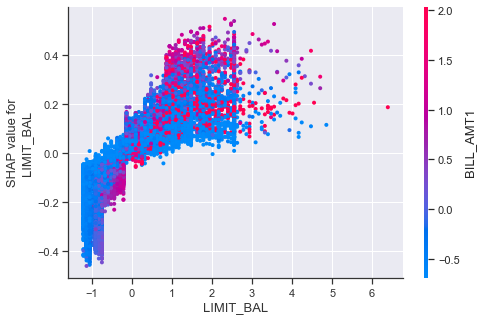

In [58]:
shap.dependence_plot("LIMIT_BAL", lgbm_shap_values[0], X_train_enc)

As LIMIT_BAL increases, SHAP values for class 0 increase as well, suggesting that class is likely to be 0 (non default) with higher values for LIMIT_BAL, which makes sense.

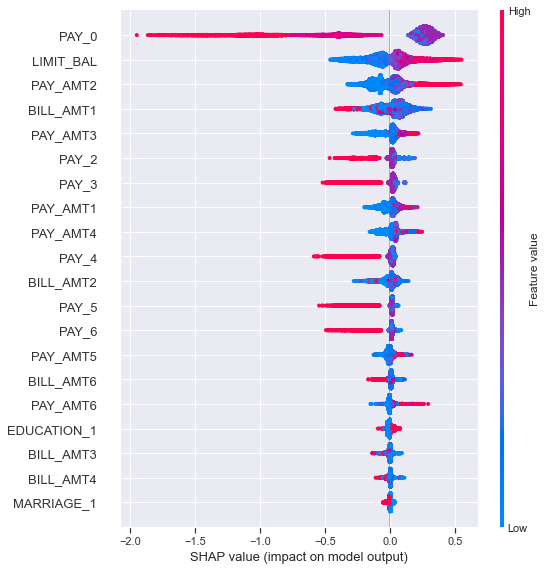

In [59]:
shap.summary_plot(lgbm_shap_values[0], X_train_enc)

In [60]:
X_test_enc = pd.DataFrame(
    data=preprocessor.transform(X_test),
    columns=feature_names,
    index=X_test.index,
)

test_lgbm_shap_values = lgbm_explainer.shap_values(X_test_enc)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [61]:
lgbm_tuned.predict_proba(X_test_enc)[1]

array([0.74058038, 0.25941962])

In [62]:
lgbm_tuned.predict(X_test_enc, raw_score=True)[1]

-1.0489872894312522

In [63]:
lgbm_explainer.expected_value

[0.5594117098974121, -0.5594117098974121]

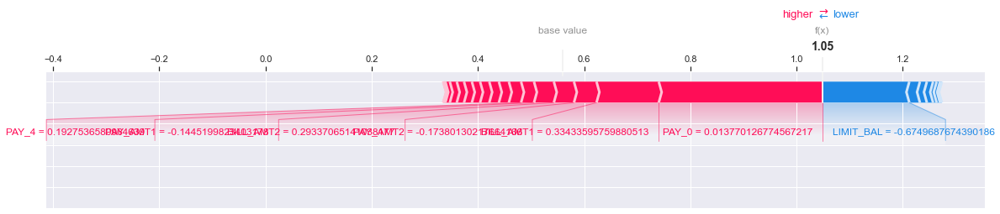

In [64]:
shap.force_plot(
    lgbm_explainer.expected_value[0],
    test_lgbm_shap_values[0][1, :],
    X_test_enc.iloc[1, :],
    matplotlib=True,
)

#### Summary of observations

1. From the analysis above we observe that PAY_\d{0,2,3,4}, PAY_AMT, LIM_BAL features seem to be one of the most important features with PAY_0 being the topmost feature.
2. The SHAP dependence plot demonstrates that the class is likely to be 0 (non default) for higher values for LIMIT_BAL, which makes sense.
3. The features EDUCATION and SEX doesn't seem to influence the prediction much. This might be because of the noise in the EDUCTION column; there are a number of unknown values in this column.

## 12. Results on the test set <a name="12"></a>
<hr>



**My tasks:**

1. Try your best performing model on the test data and report test scores. 
2. Do the test scores agree with the validation scores from before? To what extent do you trust your results? Do you think you've had issues with optimization bias? 
3. Take one or two test predictions and explain them with SHAP force plots.  

In [66]:
from sklearn.metrics import f1_score

best_model = random_search_lgbm.best_estimator_
print("Grid Search best model validation score: %0.3f" % (random_search_lgbm.best_score_))

predictions = best_model.predict(X_test)
print(
    "Macro-average f1 score on the test set: %0.3f"
    % (f1_score(y_test, predictions, average="macro"))
)

Grid Search best model validation score: 0.707
Macro-average f1 score on the test set: 0.695


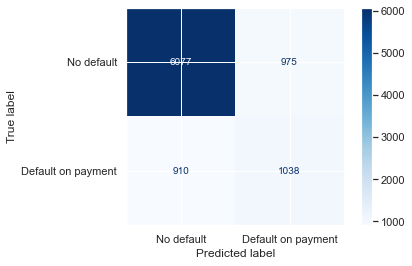

In [69]:
from sklearn.metrics import classification_report

plot_confusion_matrix(
    best_model,
    X_test,
    y_test,
    display_labels=["No default", "Default on payment"],
    values_format="d",
    cmap=plt.cm.Blues,
)

In [70]:


print(
    classification_report(
        y_test, predictions, target_names=["No default", "Default on payment"]
    )
)

                    precision    recall  f1-score   support

        No default       0.87      0.86      0.87      7052
Default on payment       0.52      0.53      0.52      1948

          accuracy                           0.79      9000
         macro avg       0.69      0.70      0.69      9000
      weighted avg       0.79      0.79      0.79      9000




The macro-average f1-score (0.695) on the held-out test set is pretty much in line with the macro-average f1-score validation score (0.707). So there doesn't seem to be severe optimization bias here.


#### 12.3  
Let's explain a default and a non-default test prediction using SHAP force plot. Let's first get indices for default and non-default examples.

In [77]:
y_test_reset = y_test.reset_index(drop=True)
non_default_ind = y_test_reset[y_test_reset == 0].index.tolist()
default_ind = y_test_reset[y_test_reset == 1].index.tolist()

ex_non_default_index = non_default_ind[0]
ex_default_index = default_ind[0]

### (1) Explanation of a non-default prediction:

In [78]:
lgbm_tuned.predict_proba(X_test_enc)[ex_non_default_index]

array([0.697763, 0.302237])

In [79]:
lgbm_tuned.predict(X_test_enc, raw_score=True)[ex_non_default_index]

-0.8366680315908269

In [80]:
lgbm_explainer.expected_value

[0.5594117098974121, -0.5594117098974121]

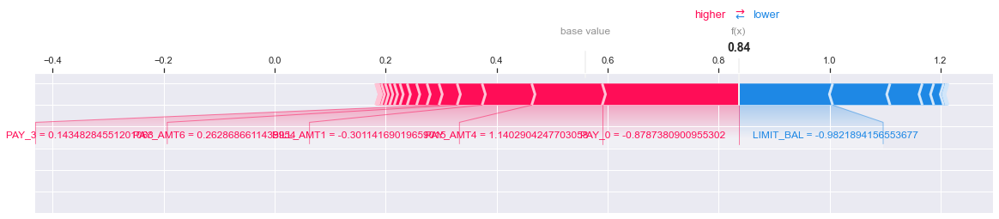

In [81]:
shap.force_plot(
    lgbm_explainer.expected_value[0],
    test_lgbm_shap_values[0][ex_non_default_index, :],
    X_test_enc.iloc[ex_non_default_index, :],
    matplotlib=True,
)

The raw model score is 0.84, which is greater than the base value 0.5594 and so the prediction is that the user is not likely to default on credit payment (because we are consider the shap values for class 0).

### (2) Explanation of a default prediction

In [82]:
lgbm_tuned.predict_proba(X_test_enc)[ex_default_index]

array([0.26909715, 0.73090285])

In [83]:
lgbm_tuned.predict(X_test_enc, raw_score=True)[ex_default_index]

0.9992080664830868

In [84]:
lgbm_explainer.expected_value

[0.5594117098974121, -0.5594117098974121]

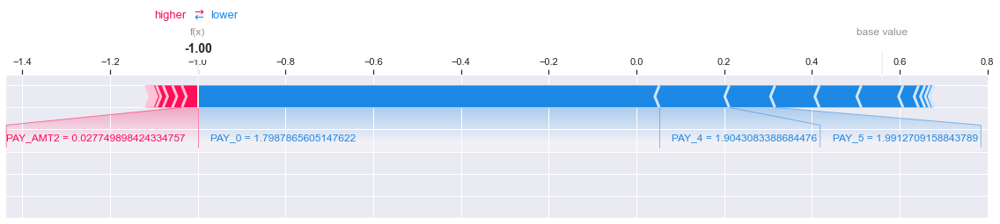

In [85]:
shap.force_plot(
    lgbm_explainer.expected_value[0],
    test_lgbm_shap_values[0][ex_default_index, :],
    X_test_enc.iloc[ex_default_index, :],
    matplotlib=True,
)

The raw model score is -1.00, which is smaller than the base value 0.5594 and so the prediction is that the user is likely to default on the credit payment (class 1).
Positive values for PAY_* variables seem to push the prediction towards a lower value.

## 13. Summary of results <a name="13"></a>
<hr>


**My tasks:**

1. Create a table summarizing important results. 
2. Write concluding remarks.
3. Discuss other ideas that you did not try but could potentially improve the performance/interpretability . 
3. Report your final test score along with the metric you used at the top of this notebook in the [Submission instructions section](#si).

In [89]:
pd.DataFrame(results).T
summary_df = pd.DataFrame(results).T
comments = {
    "dummy": "Baseline of 0.50 macro-average f1 score.",
    "logreg": "Improvement over the baseline but underfitting.",
    "logreg (tuned)": "Slight improvement but still underfitting.",
    "RBF SVM": "Improvement over tuned logistic regression but slow.",
    "random forest": "Improvement over tuned logistic regression but overfitting.",
    "xgboost": "Best results so far and less overfitting compared to random forest.",
    "lgbm": "Improvement over xgboost and less overfitting.",
    "random forest+ feat_sel": "Feature selection with L1 regularization helps a tiny bit. Selects 29 features.",
    "xgboost+ feat_sel": "Very tiny improvement with L1 feature selection.",
    "lgbm+ feat_sel": "No improvemnt with L1 feature selection.",
    "random forest (tuned)": "Hyperparameter optimization helped! Best results so far.",
    "lgbm (tuned)": "Hyperparameter optimization helped. Best results overall! The scores are very similar to random forest scores but picking this as the best model for its speed.",
    
}
pd.set_option('display.max_colwidth', 0)
summary_df["comments"] = comments.values()
summary_df


,fit_time,score_time,test_score,train_score,comments
Dummy,0.003 (+/- 0.001),0.002 (+/- 0.000),0.502 (+/- 0.005),0.500 (+/- 0.006),Baseline of 0.50 macro-average f1 score.
logreg,0.389 (+/- 0.083),0.012 (+/- 0.001),0.625 (+/- 0.006),0.628 (+/- 0.003),Improvement over the baseline but underfitting.
logreg (tuned),0.100 (+/- 0.005),0.011 (+/- 0.000),0.629 (+/- 0.006),0.630 (+/- 0.003),Slight improvement but still underfitting.
RBF SVM,9.815 (+/- 0.612),0.981 (+/- 0.092),0.675 (+/- 0.008),0.686 (+/- 0.002),Improvement over tuned logistic regression but slow.
random forest,3.207 (+/- 0.166),0.087 (+/- 0.009),0.668 (+/- 0.003),0.999 (+/- 0.000),Improvement over tuned logistic regression but overfitting.
xgboost,1.057 (+/- 0.097),0.017 (+/- 0.002),0.681 (+/- 0.006),0.868 (+/- 0.004),Best results so far and less overfitting compared to random forest.
lgbm,0.320 (+/- 0.140),0.019 (+/- 0.003),0.691 (+/- 0.011),0.772 (+/- 0.004),Improvement over xgboost and less overfitting.
RFE + Logistic Reg C=0.01,0.258 (+/- 0.026),0.012 (+/- 0.001),0.628 (+/- 0.007),0.631 (+/- 0.003),Feature selection with L1 regularization helps a tiny bit. Selects 29 features.
random forest+ feat_sel,4.250 (+/- 0.418),0.082 (+/- 0.005),0.670 (+/- 0.007),0.999 (+/- 0.000),Very tiny improvement with L1 feature selection.
xgboost+ feat_sel,1.932 (+/- 0.456),0.018 (+/- 0.004),0.683 (+/- 0.009),0.864 (+/- 0.003),No improvemnt with L1 feature selection.


### Conclusion 
All our models beat the baseline. Our best model was LightGBM classifier with tuned hyperparameters. It achieved cross-validation macro-average f1 score of 0.707. The scores do not seem to overfit much; the gap between mean train score (0.719) and mean cross-validation score (0.707) is not big. These scores are very similar to the tuned random forest. But random forest seems to overfit. Also, it's much slower than LightGBM. So picked LightGBM model as our final model.

We observed the macro-average f1 score of 0.695 using this model on the held out test set, which is in line with mean cross-validation macro-average f1-score (0.707). So there doesn't seem to be severe optimization bias here.

We observed that L1 feature selection helped a tiny bit for random forests. But we did not observe any improvement in LightGBM scores with feature selection in the pipeline. In general, we have small number of features in this problem and feature selection doesn't seem crucial.

Our analysis of feature importances shows that our PAY_\d{0,2}, LIMIT_*, and PAY_AMT* variables seems to be most important features. Although SEX feature doesn't show up as one of the most important features, depending upon the context it might be a good idea to drop this feature from our analysis.



### Some other ideas:

Preprocessing and feature engineering

The BILL_AMT* and PAY_AMT* variables are the bill amount, and amount paid, respectively. We could try making new features by subtracting or otherwise combining these, which would be the amount you paid relative to the amount owed.
There are a number of collinear features in the dataset, especially, our PAY_\d{0,5} features, which are one of the topmost important features. We could create new features by combining these features.
More data cleaning would probably help.
In my opinion, data cleaning and feature engineering are very important here.
More careful hyperparameter optimization

Because of limited time, we did not carry out extensive hyperparameter optimization. For instance, we didn't carry out hyperparameter optimization with the XGBoost model. It might be worth exploring this area a bit more.